# Delineate Watersheds from processed TDX-Hydro GeoParquet files

This notebook demonstrates how to use functions in the [WikiWatershed/global-hydrography](https://github.com/WikiWatershed/global-hydrography) package to delineate watersheds based on the additional attributes added to TDX-Hydro datasets by this package during processing.

### Modified Nested Set Index (MNSI) for Delineation
Based on [Haag and Shokoufandeh (2019)](https://doi.org/10.1016/j.envsoft.2017.06.009), three MNSI fields can be used for extremely rapid watershed delineation:
- **`ROOT_ID`**: identifies the downstream most stream reach or point of confluence for the watershed. This is useful for quickly subsetting the dataset prior to delineation.
- **`DISCOVER_TIME`**: indicates the number of iterations in a depth first search to reach the stream reach
- **`FINISH_TIME`**: indicates the number of iterations to revisit the reach stream.

### Reach/Basin Groups for Pre-Dissolving Sub-Watershed Boundaries
For the basin files, there are also two additional fields to support pre-dissolving basin geometries and improve delineation performance.
- **`DISSOLVE_ROOT_ID`**: identifies the most downstream elements of a subshed (grouping of basins to pre-dissolve), to serve a similar purpose as a USGS Hydrologic Unit (HUC). Each contains typically 200 `LINKNO` records.
- **`ELEMENT_COUNT`**: indicates the number of upstream basins for a stream reach.

# Python Imports

In this step we will import the necessary python dependencies for this example.

This notebook also assumes that you will have completed the necessary setup steps outline in the **[Installation Instructions](README.md#get-started)** (and also completed as part of the notebook `1_GetData.ipynb`) 

/Users/aaufdenkampe/miniconda3/envs/hydrography/lib/python3.11/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
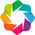

In [1]:
from pathlib import Path

import geopandas as gpd
from shapely.geometry import Point
import geoviews as gv
gv.extension('bokeh')

import topojson as tp

import global_hydrography as gh
from global_hydrography.delineation.mnsi import MNSI_FIELDS
from global_hydrography.preprocess import TDXPreprocessor
from global_hydrography.process import DISSOLVE_ROOT_ID, ELEMENT_COUNT


# Compile files that need to be processed

In this step we will compile a list of the files that need to be processed to have a modified nested set index. Note this step assumes that you have downloaded the files to the same directory and used the same naming convention as the `1_GetData.ipynb` example notebook. If you have opted to use a different location or naming convention you will need to modify this step accordingly.

In [2]:
# Confirm your current working directory (cwd) and repo/project directory
working_dir = Path.cwd()
project_dir = working_dir.parent
data_dir = project_dir / 'data_temp' # a temporary data directory that we .gitignore
tdx_dir = data_dir / 'nga'

In [3]:
# Get desired filepaths for a hydroregion
tdx_hydro_region = 7020038340 # Eastern USA

streamnet_file, basins_file = gh.process.select_tdx_files(
    tdx_dir / 'processed', 
    tdx_hydro_region,
    '.parquet'
)
streamnet_file.name

'TDX_streamnet_mnsi_7020038340_01.parquet'

In [4]:
basins_file.name

'TDX_streamreach_basins_mnsi_7020038340_01.parquet'

In [5]:
RIVER_ROOTS = {
    'Delaware': 750117989,
    'Susquehanna': 750127466,
    'Santee': 750288662,
}

In [6]:
# Read only the rows for the selected river root
# This substantially speeds reading the data
root = RIVER_ROOTS['Delaware']

# Basins
basins_subset_gdf = gpd.read_parquet(
    basins_file,
    filters=[('ROOT_ID', '==', root)]
)
basins_subset_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 3913 entries, 750026209 to 750233382
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geometry          3913 non-null   geometry
 1   ROOT_ID           3913 non-null   int32   
 2   FINISH_TIME       3913 non-null   int32   
 3   DISCOVER_TIME     3913 non-null   int32   
 4   DISSOLVE_ROOT_ID  3913 non-null   int32   
 5   ELEMENT_COUNT     3913 non-null   int32   
dtypes: geometry(1), int32(5)
memory usage: 122.3 KB


In [7]:
# Streams
streamnet_subset_gdf = gpd.read_parquet(
    streamnet_file,
    filters=[('ROOT_ID', '==', root)]
)
streamnet_subset_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 3913 entries, 750026209 to 750233382
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   DSLINKNO          3913 non-null   int32   
 1   USLINKNO1         3913 non-null   int32   
 2   USLINKNO2         3913 non-null   int32   
 3   ROOT_ID           3913 non-null   int32   
 4   DISCOVER_TIME     3913 non-null   int32   
 5   FINISH_TIME       3913 non-null   int32   
 6   ELEMENT_COUNT     3913 non-null   int32   
 7   DISSOLVE_ROOT_ID  3913 non-null   int32   
 8   strmOrder         3913 non-null   int32   
 9   Length            3913 non-null   float64 
 10  Magnitude         3913 non-null   int32   
 11  DSContArea        3913 non-null   float64 
 12  strmDrop          3913 non-null   float64 
 13  Slope             3913 non-null   float64 
 14  StraightL         3913 non-null   float64 
 15  USContArea        3913 non-null   float64 
 16  DOUTEND 

# Map Root Watershed: Delaware River Basin

In [8]:
# Create basemap for use later
basemap = gv.tile_sources.CartoLight().opts(width=500, height=400)

In [9]:
# Select Larger Streams to speed mapping
stream_order_min = 3

selected_streams_gdf = streamnet_subset_gdf[
    (streamnet_subset_gdf['strmOrder'] >= stream_order_min)
]

In [10]:
# Create GeoViews Map object
streams_plot = (
    gv.Path(selected_streams_gdf.geometry) *
    basemap
).opts(
    title=f'Threshold Stream Order = {stream_order_min}'
)

In [11]:
# Render GeoViews Map
streams_plot

:Overlay
   .Path.I :Path   [Longitude,Latitude]
   .WMTS.I :WMTS   [Longitude,Latitude]

# Delineate Watershed from MNSI fields

## Select Basin from Lat/Lon
Where x = longitude, y = latitude

In [12]:
# 3rd Street Bridge in Avondale, PA. 39.828305, -75.780778
# point = Point(-75.780778, 39.828305)
# Landenberg Rd Bridge in Landenberg, PA 39.778049, -75.771229
point = Point(-75.771229, 39.778049)

In [13]:
# Find LINKNO of Basin containing Lat/Lon
point_df = basins_subset_gdf.loc[basins_subset_gdf.geometry.contains(point)]
point_df

,geometry,ROOT_ID,FINISH_TIME,DISCOVER_TIME,DISSOLVE_ROOT_ID,ELEMENT_COUNT
LINKNO,,,,,,
750112659,"POLYGON ((-75.77161 39.79194, -75.77117 39.791...",750117989,169,160,750115621,9


In [14]:
%%timeit
basins_subset_gdf.loc[basins_subset_gdf.geometry.contains(point)]
# 189 μs ± 1.18 μs

184 μs ± 10.2 μs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


## Get all Upstream Basins

In [15]:
d = point_df.DISCOVER_TIME.values[0]
f = point_df.FINISH_TIME.values[0]
d,f

(np.int32(160), np.int32(169))

In [16]:
basins_upstream_gdf = basins_subset_gdf[
    basins_subset_gdf.DISCOVER_TIME.between(d,f-1)
].sort_values(by=['DISCOVER_TIME'])
basins_upstream_gdf

,geometry,ROOT_ID,FINISH_TIME,DISCOVER_TIME,DISSOLVE_ROOT_ID,ELEMENT_COUNT
LINKNO,,,,,,
750112659,"POLYGON ((-75.77161 39.79194, -75.77117 39.791...",750117989,169,160,750115621,9
750043395,"POLYGON ((-75.75306 39.81739, -75.75272 39.817...",750117989,162,161,750115621,1
750112067,"POLYGON ((-75.7705 39.81017, -75.77028 39.8101...",750117989,169,162,750115621,7
750042803,"POLYGON ((-75.79672 39.82572, -75.7965 39.8257...",750117989,164,163,750115621,1
750131010,"POLYGON ((-75.76528 39.83983, -75.76483 39.839...",750117989,169,164,750115621,5
750054050,"POLYGON ((-75.83828 39.87417, -75.83817 39.874...",750117989,166,165,750115621,1
750130418,"POLYGON ((-75.77672 39.84539, -75.7765 39.8453...",750117989,169,166,750115621,3
750055825,"POLYGON ((-75.77694 39.89317, -75.77672 39.893...",750117989,168,167,750115621,1
750055233,"POLYGON ((-75.80306 39.89294, -75.80294 39.892...",750117989,169,168,750115621,1


In [17]:
%%timeit
basins_subset_gdf[basins_subset_gdf.DISCOVER_TIME.between(d,f-1)]
# 163 μs ± 1.61 μs

159 μs ± 2.75 μs per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


## Map Delineated Watershed

In [18]:
watershed_plot =(
    gv.Path(streamnet_subset_gdf.loc[basins_upstream_gdf.index]) * 
    gv.Path(basins_upstream_gdf) *
    basemap
)
watershed_plot

:Overlay
   .Path.I  :Path   [Longitude,Latitude]   (DSLINKNO,USLINKNO1,USLINKNO2,ROOT_ID,DISCOVER_TIME,FINISH_TIME,ELEMENT_COUNT,DISSOLVE_ROOT_ID,strmOrder,Length,Magnitude,DSContArea,strmDrop,Slope,StraightL,USContArea,DOUTEND,DOUTSTART,DOUTMID)
   .Path.II :Path   [Longitude,Latitude]   (ROOT_ID,FINISH_TIME,DISCOVER_TIME,DISSOLVE_ROOT_ID,ELEMENT_COUNT)
   .WMTS.I  :WMTS   [Longitude,Latitude]

## Get Watershed Boundary

[Geopandas `gdf.dissolve()`](https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.dissolve.html) is a geospatial groupby function that applies "the [`union_all()`](https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoSeries.union_all.html) method to all geometries within a groupself." 

Here we use the [`union_all()`](https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoSeries.union_all.html) method directly, since we have already selected the records. We also use the signficantly faster `method="coverage"` option, optimized for non-overlapping polygons (it can produce invalid geometries if the polygons overlap).

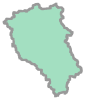

In [19]:
watershed_boundary = basins_upstream_gdf.geometry.union_all()
watershed_boundary

In [20]:
# Map Watershed Boundary
(
    gv.Path(streamnet_subset_gdf.loc[basins_upstream_gdf.index]) * 
    gv.Path(basins_upstream_gdf) *
    gv.Path(watershed_boundary) *
    basemap
)
# zoom to confirm that there are no invalid geometries.

:Overlay
   .Path.I   :Path   [Longitude,Latitude]   (DSLINKNO,USLINKNO1,USLINKNO2,ROOT_ID,DISCOVER_TIME,FINISH_TIME,ELEMENT_COUNT,DISSOLVE_ROOT_ID,strmOrder,Length,Magnitude,DSContArea,strmDrop,Slope,StraightL,USContArea,DOUTEND,DOUTSTART,DOUTMID)
   .Path.II  :Path   [Longitude,Latitude]   (ROOT_ID,FINISH_TIME,DISCOVER_TIME,DISSOLVE_ROOT_ID,ELEMENT_COUNT)
   .Path.III :Path   [Longitude,Latitude]
   .WMTS.I   :WMTS   [Longitude,Latitude]

In [21]:
%%timeit
basins_upstream_gdf.geometry.union_all(method='unary') # Default, more accurate but slower
# 12.6 ms ± 137 μs

12.7 ms ± 56.6 μs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [22]:
%%timeit
basins_upstream_gdf.geometry.union_all(method='coverage') # Faster, but only for non-overlapping polygons
# 680 μs ± 6.54 μs
# 18.5x faster!!!

696 μs ± 11.7 μs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


# Group Basins for Delaware River Basin (DRB) into TDX HydroUnits (HU)

Create TDX Hydrologic Units (HU) by grouping basins by their `DISSOLVE_ROOT_ID`, as explored in `sandbox/simplify_basins.ipynb`. 

These TDX HUs are about the size of a USGS HUC-08.

In [33]:
# Dissolve by 'DISSOLVE_ROOT_ID'
tdx_hu_fullres_drb_gdf = basins_subset_gdf[['geometry', 'DISSOLVE_ROOT_ID']].dissolve(
    by='DISSOLVE_ROOT_ID',
    method='coverage',
)
tdx_hu_fullres_drb_gdf.info()
tdx_hu_fullres_drb_gdf.index

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 25 entries, 750107906 to 750232790
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  25 non-null     geometry
dtypes: geometry(1)
memory usage: 300.0 bytes


Index([750107906, 750114423, 750115621, 750116179, 750117989, 750123899,
       750124490, 750126273, 750126275, 750129214, 750130410, 750132765,
       750133366, 750136333, 750147552, 750153484, 750159991, 750181865,
       750187801, 750189559, 750193141, 750195478, 750200224, 750212662,
       750232790],
      dtype='int32', name='DISSOLVE_ROOT_ID')

In [68]:
# TopoSimplify
topo = tp.Topology(
    data=tdx_hu_fullres_drb_gdf, 
    prequantize=False,
)

tolerance = 0.0001 
    # https://mattijn.github.io/topojson/api/topojson.core.topology.html#toposimplify
    # 0.00008 used for MMW HUC12s
tdx_hu_drb_simplified_gdf = topo.toposimplify(
    epsilon=tolerance, 
    simplify_with='simplification', 
    simplify_algorithm='dp',
).to_gdf()
tdx_hu_drb_simplified_gdf.info()

/Users/aaufdenkampe/miniconda3/envs/hydrography/lib/python3.11/site-packages/shapely/set_operations.py:131: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)


<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 25 entries, 750107906 to 750232790
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  25 non-null     geometry
dtypes: geometry(1)
memory usage: 400.0 bytes


In [70]:
tdx_hu_drb_simplified_gdf.index

Index([750107906, 750114423, 750115621, 750116179, 750117989, 750123899,
       750124490, 750126273, 750126275, 750129214, 750130410, 750132765,
       750133366, 750136333, 750147552, 750153484, 750159991, 750181865,
       750187801, 750189559, 750193141, 750195478, 750200224, 750212662,
       750232790],
      dtype='int64')

In [71]:
# Reset index dtype
tdx_hu_drb_simplified_gdf.index = tdx_hu_drb_simplified_gdf.index.astype('int32')
tdx_hu_drb_simplified_gdf.index

Index([750107906, 750114423, 750115621, 750116179, 750117989, 750123899,
       750124490, 750126273, 750126275, 750129214, 750130410, 750132765,
       750133366, 750136333, 750147552, 750153484, 750159991, 750181865,
       750187801, 750189559, 750193141, 750195478, 750200224, 750212662,
       750232790],
      dtype='int32')

## Plot DRB HUs

In [64]:
(streams_plot 
 * gv.Path(tdx_hu_drb_simplified_gdf).opts(color='red', line_width=0.5)
)

:Overlay
   .Path.I  :Path   [Longitude,Latitude]
   .WMTS.I  :WMTS   [Longitude,Latitude]
   .Path.II :Path   [Longitude,Latitude]

## Append MNSI & Dissolve Group Attributes Relevant to Hydro Units

- 'DISSOLVE_ROOT_ID' get's renamed to 'HU_ROOT_ID', and cooresponds to the 'LINKNO' of the downstream basin/stream.
- 'DISCOVER_TIME' of the root is useful for determining upstream HUs
-'ELEMENT_COUNT' is the number of original TDX LINKNO Basin Records are in the group.
- 'ROOT_ID' is the 'LINKNO' of the terminal downstream basin/stream draining to the ocean.

In [57]:
basins_subset_gdf.info()
basins_subset_gdf.index

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 3913 entries, 750026209 to 750233382
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geometry          3913 non-null   geometry
 1   ROOT_ID           3913 non-null   int32   
 2   FINISH_TIME       3913 non-null   int32   
 3   DISCOVER_TIME     3913 non-null   int32   
 4   DISSOLVE_ROOT_ID  3913 non-null   int32   
 5   ELEMENT_COUNT     3913 non-null   int32   
dtypes: geometry(1), int32(5)
memory usage: 122.3 KB


Index([750026209, 750026210, 750026212, 750026801, 750026802, 750026804,
       750027393, 750027394, 750027396, 750027397,
       ...
       750220358, 750220950, 750221542, 750223910, 750224502, 750231014,
       750231606, 750232198, 750232790, 750233382],
      dtype='int32', name='LINKNO', length=3913)

In [58]:
basins_subset_gdf.columns

Index(['geometry', 'ROOT_ID', 'FINISH_TIME', 'DISCOVER_TIME',
       'DISSOLVE_ROOT_ID', 'ELEMENT_COUNT'],
      dtype='object')

In [78]:
columns_to_join = ['ELEMENT_COUNT', 'DISCOVER_TIME', 'FINISH_TIME', 'ROOT_ID']
tdx_hu_drb_gdf = tdx_hu_drb_simplified_gdf.join(
    basins_subset_gdf[columns_to_join],
)
tdx_hu_drb_gdf.index.rename('LINKNO', inplace=True)
tdx_hu_drb_gdf.sort_values('DISCOVER_TIME', inplace=True)
tdx_hu_drb_gdf.info()
tdx_hu_drb_gdf.index


<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 25 entries, 750117989 to 750212662
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   geometry       25 non-null     geometry
 1   ELEMENT_COUNT  25 non-null     int32   
 2   DISCOVER_TIME  25 non-null     int32   
 3   FINISH_TIME    25 non-null     int32   
 4   ROOT_ID        25 non-null     int32   
dtypes: geometry(1), int32(4)
memory usage: 700.0 bytes


Index([750117989, 750115621, 750126275, 750124490, 750130410, 750133366,
       750107906, 750126273, 750136333, 750123899, 750114423, 750129214,
       750153484, 750132765, 750193141, 750159991, 750116179, 750147552,
       750187801, 750232790, 750200224, 750195478, 750181865, 750189559,
       750212662],
      dtype='int32', name='LINKNO')

In [79]:
tdx_hu_drb_gdf

,geometry,ELEMENT_COUNT,DISCOVER_TIME,FINISH_TIME,ROOT_ID
LINKNO,,,,,
750117989,"MULTIPOLYGON (((-75.5295 39.70517, -75.5305 39...",27,1,3914,750117989
750115621,"MULTIPOLYGON (((-75.88817 40.02072, -75.88817 ...",187,4,191,750117989
750126275,"MULTIPOLYGON (((-75.60672 40.0545, -75.60639 4...",200,215,3914,750117989
750124490,"MULTIPOLYGON (((-75.62506 40.42994, -75.62506 ...",117,415,532,750117989
750130410,"MULTIPOLYGON (((-75.66494 40.45794, -75.66483 ...",122,532,1019,750117989
750133366,"MULTIPOLYGON (((-76.14972 40.46694, -76.14972 ...",200,654,1019,750117989
750107906,"MULTIPOLYGON (((-76.05083 40.47683, -76.05083 ...",165,854,1019,750117989
750126273,"MULTIPOLYGON (((-75.20117 40.35461, -75.20139 ...",189,1019,3914,750117989
750136333,"MULTIPOLYGON (((-74.90572 39.94639, -74.90583 ...",125,1132,1257,750117989


# Rapid Watershed Delineation

Delineate most of DRB, using mix of simplified Hydro Units and local full resolution basins.

In [82]:
# Mainstem Delaware downstream of Philly, before Christina River
point = Point(-75.37527, 39.82323)


In [106]:
# Find LINKNO of Basin containing Lat/Lon
point_s = basins_subset_gdf.loc[basins_subset_gdf.geometry.contains(point)].squeeze()
point_s

geometry            POLYGON ((-75.3777222222215 39.849833333333, -...
ROOT_ID                                                     750117989
FINISH_TIME                                                      3914
DISCOVER_TIME                                                     239
DISSOLVE_ROOT_ID                                            750126275
ELEMENT_COUNT                                                     176
Name: 750142850, dtype: object

In [108]:
d = point_s.DISCOVER_TIME
f = point_s.FINISH_TIME
hu = point_s.DISSOLVE_ROOT_ID
d,f, hu

(np.int32(239), np.int32(3914), np.int32(750126275))

In [109]:
basins_upstream_gdf = basins_subset_gdf[
    basins_subset_gdf.DISCOVER_TIME.between(d,f-1)
].sort_values(by=['DISCOVER_TIME'])
basins_upstream_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 3675 entries, 750142850 to 750058156
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geometry          3675 non-null   geometry
 1   ROOT_ID           3675 non-null   int32   
 2   FINISH_TIME       3675 non-null   int32   
 3   DISCOVER_TIME     3675 non-null   int32   
 4   DISSOLVE_ROOT_ID  3675 non-null   int32   
 5   ELEMENT_COUNT     3675 non-null   int32   
dtypes: geometry(1), int32(5)
memory usage: 114.8 KB


## Get boundary of local basins

In [118]:
# Select local basins within the same HU as point
basins_upstream_local_gdf = basins_upstream_gdf.loc[
    basins_upstream_gdf.DISSOLVE_ROOT_ID == hu,
]
basins_upstream_local_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 176 entries, 750142850 to 750131002
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geometry          176 non-null    geometry
 1   ROOT_ID           176 non-null    int32   
 2   FINISH_TIME       176 non-null    int32   
 3   DISCOVER_TIME     176 non-null    int32   
 4   DISSOLVE_ROOT_ID  176 non-null    int32   
 5   ELEMENT_COUNT     176 non-null    int32   
dtypes: geometry(1), int32(5)
memory usage: 5.5 KB


In [120]:
local_boundary_gdf = basins_upstream_local_gdf.geometry.union_all(method='coverage')

## Get boundary of upstream HUs

In [122]:
basins_upstream_nonlocal_gdf = basins_upstream_gdf.loc[
    basins_upstream_gdf.DISSOLVE_ROOT_ID != hu,
]
basins_upstream_nonlocal_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 3499 entries, 750124490 to 750058156
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geometry          3499 non-null   geometry
 1   ROOT_ID           3499 non-null   int32   
 2   FINISH_TIME       3499 non-null   int32   
 3   DISCOVER_TIME     3499 non-null   int32   
 4   DISSOLVE_ROOT_ID  3499 non-null   int32   
 5   ELEMENT_COUNT     3499 non-null   int32   
dtypes: geometry(1), int32(5)
memory usage: 109.3 KB


In [123]:
upstream_hu_list = basins_upstream_nonlocal_gdf.DISSOLVE_ROOT_ID.unique()
upstream_hu_list

array([750124490, 750130410, 750133366, 750107906, 750126273, 750136333,
       750123899, 750114423, 750129214, 750153484, 750132765, 750193141,
       750159991, 750116179, 750147552, 750187801, 750232790, 750200224,
       750195478, 750181865, 750189559, 750212662], dtype=int32)

In [127]:
upstream_hu_gdf = tdx_hu_drb_gdf.loc[
    tdx_hu_drb_gdf.index.isin(upstream_hu_list)
]
upstream_hu_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 22 entries, 750124490 to 750212662
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   geometry       22 non-null     geometry
 1   ELEMENT_COUNT  22 non-null     int32   
 2   DISCOVER_TIME  22 non-null     int32   
 3   FINISH_TIME    22 non-null     int32   
 4   ROOT_ID        22 non-null     int32   
dtypes: geometry(1), int32(4)
memory usage: 616.0 bytes
